<a href="https://colab.research.google.com/github/trinexus2002/CD_databits/blob/main/01_Proyecto_final_Fase_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


<div style="text-align: center; line-height: 0; padding-top: 9px;">
  <img src="https://storage.googleapis.com/datasets-academy/public-img/notebooks/headers/databits-header-notebook.png" alt="Databricks Learning" style="width: 100%;">
</div>


# <center>  Proyecto Final - Fase 1  </center>

## Descripción
En esta fase se explicará el proyecto y se realizará la carga de los datos. Además se implementará el correspondiente análisis exploratorio de datos (EDA)
  
<img alt="Caution" title="Caution" style="vertical-align: text-bottom; position: relative; height:1.3em; top:0.0em" src="https://storage.googleapis.com/datasets-academy/public-img/notebooks/icons/danger.png"/> **Disclaimer:** Este material ha sido preparado por el equipo de **handytec Academy®**. Se prohibe la publicación o reproducción de este material sin previa autorización de **handytec Academy®** - 2022 Todos los derechos reservados.

## Problema de negocio

Un problema imperante en el entorno bancario a nivel global se enfoca en el riesgo crediticio o riesgo de impago. 
  
Este aspecto hace refencia a las pérdidas que incurren los bancos dado que los prestamistas son incapaces de devolver los créditos otorgados. 

Lo cual conlleva la siguiente pregunta: **¿Cómo poder reducir el número de personas que caen en mora crediticia?**

## Objetivos del proyecto

El objetivo de este proyecto es construir un modelo que las entidades financieras puedan usar para ayudar a tomar las mejores decisiones financieras.

Este modelo identificará la probabilidad de caer en mora crediticia por parte de los clientes que recibieron un crédito (modelos de default comportamentales).

Mediante el uso de diferentes algoritmos se obtendrá la probabilidad de impago en cada individuo. El principal indicador que se va usar para ver la bonanza de los distintos modelos va a ser el AUC (Area Under the Curve) generado por las curvas ROC.

## Importar librerías y verificar versiones

In [1]:
import sys
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

In [2]:
print('** Versiones Actuales | Requeridas **')
print('Python:\nVersion Actual:', sys.version, ' | Requerida >= 3.6')
print('NumPy:\nVersion Actual: {:10} | Requerida >= 1.16.2'.format(np.__version__))
print('Pandas:\nVersion Actual: {:10}| Requerida >= 1.0.1'.format(pd.__version__))
print('Matplotlib:\nVersion Actual: {:10} | Requerida >= 3.0.3'.format(matplotlib.__version__))
print('Seaborn:\nVersion Actual: {:10} |Requerida >= 0.9.0 '.format(sns.__version__))

** Versiones Actuales | Requeridas **
Python:
Version Actual: 3.7.15 (default, Oct 12 2022, 19:14:55) 
[GCC 7.5.0]  | Requerida >= 3.6
NumPy:
Version Actual: 1.21.6     | Requerida >= 1.16.2
Pandas:
Version Actual: 1.3.5     | Requerida >= 1.0.1
Matplotlib:
Version Actual: 3.2.2      | Requerida >= 3.0.3
Seaborn:
Version Actual: 0.11.2     |Requerida >= 0.9.0 


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Descripción de las variables contenidas en el _dataset_

El _dataset_ usado proviene de la plataforma **Kaggle**, y se encuentra separado en dos partes. 

La primera parte contiene los datos que serán usados para el entrenamiento del modelo, que serán nombrados como *datos_training*. La segunda parte son los datos que se usarán para el test del modelo *datos_test*. Estas muestras contienen 150.000 y 101.503 registros, respectivamente (aunque existen algunos campos que tienen distintos valores ausentes). 

Accesso a la Competencia **Give Me Some Credit:** [Link de acceso](https://www.kaggle.com/c/GiveMeSomeCredit/overview)

Link de descarga correspondiente a cada dataset: 
* [training data](https://storage.googleapis.com/datasets-academy/Track%20Data%20Science/Proyecto%20Final/cs-training.csv)
* [test data](https://storage.googleapis.com/datasets-academy/Track%20Data%20Science/Proyecto%20Final/cs-test.csv)

* **SeriousDlqin2yrs:** Persona que tiene 90 días de morosidad vencida o peor (Si = 1 y  No = 0)
* **RevolvingUtilizationOfUnsecuredLines:** El saldo total en tarjetas de crédito y líneas de crédito personales (excepto bienes inmuebles y sin deuda a plazos) sobre la suma de los límites de crédito
* **Age:** Edad prestamista en años 
* **NumberOfTime30-59DaysPastDueNotWorse:** Número de veces que el prestatario ha caido en mora entre 30 y 59 días, pero no ha empeorado en los últimos 2 años 
* **DebtRatio:** Pagos mensuales de deuda sobre el ingreso bruto mensual 
* **MonthlyIncome:** Ingreso mensual 
* **NumberOfOpenCreditLinesAndLoans:** Número de préstamos abiertos (cuotas como préstamos para automóviles o hipotecas) y líneas de crédito 
* **NumberOfTimes90DaysLate:** Número de veces que el prestatario ha caido en mora entre 90 días o más 
* **NumberRealEstateLoansOrLines:** Número de préstamos hipotecarios e inmobiliarios, incluidas las líneas de crédito hipotecario 
* **NumberOfTime60-89DaysPastDueNotWorse:** Número de veces que el prestatario ha caido en mora entre 60 y 89 días, pero no ha empeorado en los últimos 2 años 
* **NumberOfDependents:** Número de dependientes en la familia excluyendose a si mismos (ej: cónyuge, hijos, etc.)

## Carga de los datos

### **Importante**

Recordar descargar los archivos localmente y subirlos al sistema de archivos de Google Colab

In [4]:
# Colocar la ruta del directorio correspondiente a cada dataset
ruta_training = "/content/drive/MyDrive/Colab Notebooks/Datasets/cs-training.csv"
ruta_test     = "/content/drive/MyDrive/Colab Notebooks/Datasets/cs-test.csv"

In [5]:
# Lectura de los datos usando pandas (creación de DataFrames)
datos_training = pd.read_csv(ruta_training, sep = ',', decimal = '.', index_col = 0)
datos_test     = pd.read_csv(ruta_test,     sep = ',', decimal = '.', index_col = 0)

## Revisión preliminar de los datasets

**Importante:** Realizar un comparativa entre el conjunto de datos de entrenamiento y test ejecutando las siguientes instrucciones

In [6]:
# Imprimir las 10 primera filas de los datos de entrenamiento
datos_training.head(10)

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
1,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
2,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
3,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
4,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
5,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0
6,0,0.213179,74,0,0.375607,3500.0,3,0,1,0,1.0
7,0,0.305682,57,0,5710.000000,NaN,8,0,3,0,0.0
8,0,0.754464,39,0,0.209940,3500.0,8,0,0,0,0.0
9,0,0.116951,27,0,46.000000,NaN,2,0,0,0,NaN
10,0,0.189169,57,0,0.606291,23684.0,9,0,4,0,2.0


In [7]:
# Imprimir las 10 últimas filas de los datos de test (usar el método tail)
datos_test.tail(10)

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
101494,NaN,0.035549,58,0,0.290323,11128.0,7,0,2,0,2.0
101495,NaN,0.218356,56,0,0.295803,1500.0,3,0,0,0,0.0
101496,NaN,0.718874,35,1,0.308047,4125.0,8,0,0,1,2.0
101497,NaN,0.021654,78,0,18.000000,NaN,8,0,0,0,0.0
101498,NaN,0.045230,67,0,0.012198,5000.0,4,0,0,0,0.0
101499,NaN,0.282653,24,0,0.068522,1400.0,5,0,0,0,0.0
101500,NaN,0.922156,36,3,0.934217,7615.0,8,0,2,0,4.0
101501,NaN,0.081596,70,0,836.000000,NaN,3,0,0,0,NaN
101502,NaN,0.335457,56,0,3568.000000,NaN,8,0,2,1,3.0
101503,NaN,0.441842,29,0,0.198918,5916.0,12,0,0,0,0.0


In [8]:
# Imprimir el número de filas y columnas de ambos datasets
print("Test: ", datos_test.shape)
print("Training: ", datos_training.shape)

Test:  (101503, 11)
Training:  (150000, 11)


In [9]:
# Imprimir los tipos de datos de cada columna en el dataset de entrenamiento
print(datos_training.dtypes)

SeriousDlqin2yrs                          int64
RevolvingUtilizationOfUnsecuredLines    float64
age                                       int64
NumberOfTime30-59DaysPastDueNotWorse      int64
DebtRatio                               float64
MonthlyIncome                           float64
NumberOfOpenCreditLinesAndLoans           int64
NumberOfTimes90DaysLate                   int64
NumberRealEstateLoansOrLines              int64
NumberOfTime60-89DaysPastDueNotWorse      int64
NumberOfDependents                      float64
dtype: object


In [10]:
# Imprimir los tipos de datos de cada columna en el dataset de test
print(datos_test.dtypes)

SeriousDlqin2yrs                        float64
RevolvingUtilizationOfUnsecuredLines    float64
age                                       int64
NumberOfTime30-59DaysPastDueNotWorse      int64
DebtRatio                               float64
MonthlyIncome                           float64
NumberOfOpenCreditLinesAndLoans           int64
NumberOfTimes90DaysLate                   int64
NumberRealEstateLoansOrLines              int64
NumberOfTime60-89DaysPastDueNotWorse      int64
NumberOfDependents                      float64
dtype: object


## Análisis exploratorio de datos

Los siguientes bloques de código nos vamos a enfocar en analizar el DataFrame `datos_training`.

**Importante:** Ejecutar las instrucciones e interpretar los resultados

### Análisis de valores duplicados

In [11]:
# Contabilizar filas duplicadas en todas sus columnas empleando los métodos duplicated() y value_counts() en el DataFrames datos_training
datos_training.duplicated().value_counts()
#datos_training.value_counts()

False    149391
True        609
dtype: int64

Existen 609 filas duplicadas en todas sus columnas dentro del datos_training.

### Análisis de valores perdidos

In [12]:
# Identificar el número de filas con valores perdidos por cada columna con los métodos isnull() y sum() en el DataFrames datos_training
datos_training.isnull().sum()

SeriousDlqin2yrs                            0
RevolvingUtilizationOfUnsecuredLines        0
age                                         0
NumberOfTime30-59DaysPastDueNotWorse        0
DebtRatio                                   0
MonthlyIncome                           29731
NumberOfOpenCreditLinesAndLoans             0
NumberOfTimes90DaysLate                     0
NumberRealEstateLoansOrLines                0
NumberOfTime60-89DaysPastDueNotWorse        0
NumberOfDependents                       3924
dtype: int64

La mayor cantidad de valores nulos esta en la columna MonthlyIncome, con 29731 blancos.  La columna con la 2da cantidad mayor de valores en blanco es NumberOfDependents con 3924.

### Análisis univariante

**Importante:** Ejecutar las instrucciones e interpretar los resultados

In [13]:
# Analizar las principales estadísticas descriptivas de cada columna en el DataFrame datos_training (usar el método describe)
datos_training.describe()

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
count,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,1.202690e+05,150000.000000,150000.000000,150000.000000,150000.000000,146076.000000
mean,0.066840,6.048438,52.295207,0.421033,353.005076,6.670221e+03,8.452760,0.265973,1.018240,0.240387,0.757222
std,0.249746,249.755371,14.771866,4.192781,2037.818523,1.438467e+04,5.145951,4.169304,1.129771,4.155179,1.115086
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.029867,41.000000,0.000000,0.175074,3.400000e+03,5.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.154181,52.000000,0.000000,0.366508,5.400000e+03,8.000000,0.000000,1.000000,0.000000,0.000000
75%,0.000000,0.559046,63.000000,0.000000,0.868254,8.249000e+03,11.000000,0.000000,2.000000,0.000000,1.000000
max,1.000000,50708.000000,109.000000,98.000000,329664.000000,3.008750e+06,58.000000,98.000000,54.000000,98.000000,20.000000


Hay un total de 150000 filas en el dataset.  Las personas en la base tienen una edad promedio de 52 años, los extremos de edad muestran una diferencia fuerte desde 0 en el minimo y 109 como la maxima.
Otros valores que presentan un sesgo elevado son: DebtRatio, NumberOfOpenCreditLinesAndLoans, NumberOfTimes90DaysLate, NumberRealEstateLoansOrLines, NumberOfTime60-89DaysPastDueNotWorse, NumberOfDependents.

In [14]:
# Realizar un conteo de las categorías en la variable SeriousDlqin2yrs empleando value_counts()
datos_training.SeriousDlqin2yrs.value_counts()

0    139974
1     10026
Name: SeriousDlqin2yrs, dtype: int64

Con el dataframe **datos_training**, realizar el siguiente análisis para la variable `MonthlyIncome`

In [15]:
ingresos = datos_training.MonthlyIncome

In [16]:
# Analizar las principales estadísticas descriptivas de la columna ingresos
ingresos.describe()

count    1.202690e+05
mean     6.670221e+03
std      1.438467e+04
min      0.000000e+00
25%      3.400000e+03
50%      5.400000e+03
75%      8.249000e+03
max      3.008750e+06
Name: MonthlyIncome, dtype: float64

Text(0.5, 1.0, 'Ingresos')

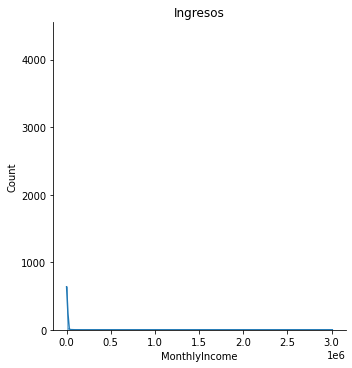

In [17]:
# Crear un histograma de la variable ingresos (usar la librería seaborns)
#sns.histplot(ingresos)
sns.displot(ingresos, kde=True)
plt.title('Ingresos')


In [18]:
# Obtener los deciles de la variable ingresos
ingresos.quantile(np.arange(0, 1.05, 0.05))

0.00          0.0
0.05       1300.0
0.10       2005.0
0.15       2500.0
0.20       3000.0
0.25       3400.0
0.30       3800.0
0.35       4166.0
0.40       4544.2
0.45       5000.0
0.50       5400.0
0.55       5855.0
0.60       6300.0
0.65       6916.0
0.70       7500.0
0.75       8249.0
0.80       9083.0
0.85      10100.0
0.90      11666.0
0.95      14587.6
1.00    3008750.0
Name: MonthlyIncome, dtype: float64

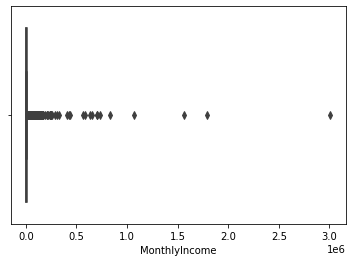

In [19]:
# Crear un box-plot la variable ingresos (usar la librería seaborns)
sns.boxplot(x=ingresos)

### Análisis multivariante

**Importante:** Ejecutar las instrucciones e interpretar los resultados

In [21]:
# Agrupar el dataframe datos_training por la variable SeriousDlqin2yrs y emplear como formas de agregación el promedio y la mediana
datos_training.groupby('SeriousDlqin2yrs').agg(['mean', 'median'])

RevolvingUtilizationOfUnsecuredLines                  age  \
                                                 mean    median       mean   
SeriousDlqin2yrs                                                             
0                                            6.168855  0.133288  52.751375   
1                                            4.367282  0.838853  45.926591   

                        NumberOfTime30-59DaysPastDueNotWorse         \
                 median                                 mean median   
SeriousDlqin2yrs                                                      
0                  52.0                             0.280109    0.0   
1                  45.0                             2.388490    0.0   

                   DebtRatio           MonthlyIncome          \
                        mean    median          mean  median   
SeriousDlqin2yrs                                               
0                 357.151168  0.362659   6747.837774  5466.0   
1                 295.121066  0.428227   5630.826493  4500.0   

                 NumberOfOpenCreditLinesAndLoans         \
                                            mean median   
SeriousDlqin2yrs                                          
0                                       8.493620    8.0   
1                                       7.882306    7.0   

                 NumberOfTimes90DaysLate        NumberRealEstateLoansOrLines  \
                                    mean median                         mean   
SeriousDlqin2yrs                                                               
0                               0.135225    0.0                     1.020368   
1                               2.091362    0.0                     0.988530   

                        NumberOfTime60-89DaysPastDueNotWorse         \
                 median                                 mean median   
SeriousDlqin2yrs                                                      
0                   1.0                             0.126666    0.0   
1                   1.0                             1.828047    0.0   

                 NumberOfDependents         
                               mean median  
SeriousDlqin2yrs                            
0                          0.743417    0.0  
1                          0.948208    0.0

Matriz de correlaciones

In [25]:
# Generar la matriz de correlaciones entre las variables del DataFrame datos_training
matriz_corr = datos_training\
.corr()\
.round(decimals=2)

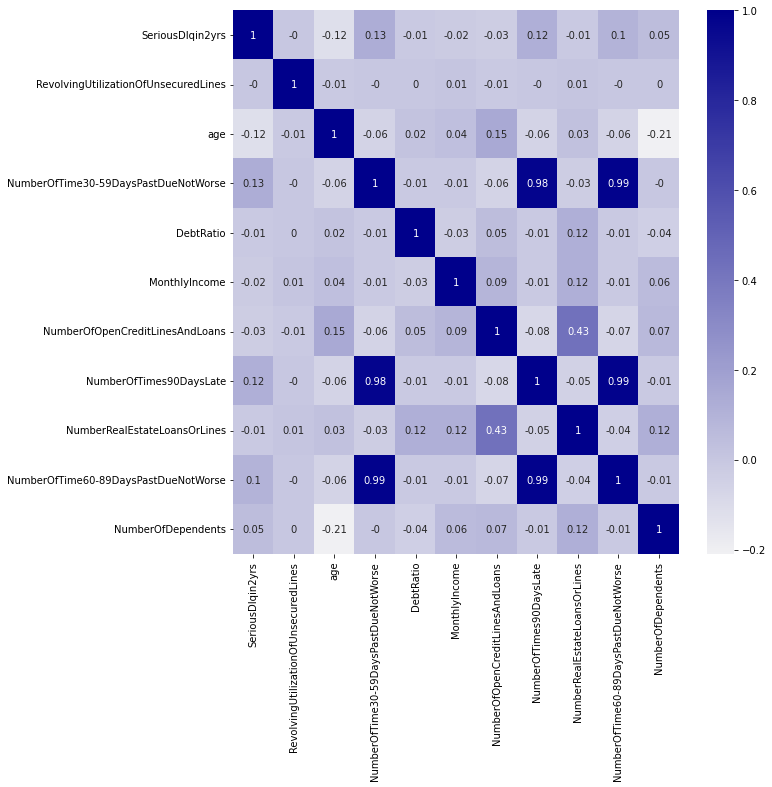

In [26]:
# Graficar la matriz de correlaciones
plt.figure(figsize=(10,10))
sns.heatmap(round(matriz_corr, 2), annot=True, fmt=".2g",
            cmap = sns.light_palette("darkblue", as_cmap=True))

## Hallazgos a partir del análisis exploratorio de datos

Documentar los hallazgos identificados:
- H1 Hay 609 valores duplicados. Debe tratarse la data para llenar los 29731 filas vacias de Ingresos.
- H2 una gran variacion entre el decil 95% y el max. Recomendado seria recortar los extremos para quitar valores atipicos.
- H3 Estan altamente correlacionados el atrasarse mas de 90 dias con los que se han atrasado 60 o 30 dias.
- H4

---

## Perfilamiento de datos

**Introducción:**
El perfilamiento de datos es **el proceso de revisión exhaustiva de las fuentes de información**, la comprensión de su estructura, contenido e interrelaciones, identificando su potencial o problemáticas para futuros proyectos. Consta de diferentes **técnicas estadísticas** que proporcionan información sobre las **características cualitativas de los datos**, siendo unos de sus objetivos principales el descubrir y validar los metadatos.

El perfilamiento ayuda a descubrir, comprender y organizar los datos, respondiendo las siguientes preguntas podremos visibilizar como estamos gestionando los datos de nuestra organización.

* ¿Los datos están completos?, ¿Existen valores blancos o nulos?
* ¿Los datos son únicos?, ¿Cuántos valores distintos existen?, ¿Los datos están duplicados?
* ¿Existe algún patrón anómalo?, ¿Cuál es la distribución de patrones en los datos?, ¿Son los patrones esperados?
* ¿Cuáles son los valores: máximo, mínimo y promedio?, ¿Son los rangos esperados?


### Perfilamiento de datos con Python

Utilizaremos el paquete `pandas-profiling` de Python, el cuál agrupa varias herramientas para la exploración de datos, y podemos generar un reporte consolidado en formato HTML *(HTML5 & CSS3)* con los resultados del análisis de la fuente de datos desde un `DataFrame` de `pandas`.
<br>

Para mayor detalle del paquete `pandas-profiling` (instalación, uso avanzado, dependencias): [*"Pandas Profiling Package"*](https://github.com/pandas-profiling/pandas-profiling)

Se requiere instalar la librería para el perfilamiento de datos ```pandas_profiling==2.7.1```

In [27]:
!pip install pandas_profiling==2.7.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 252 kB 4.7 MB/s 
     |████████████████████████████████| 58 kB 5.4 MB/s 
     |████████████████████████████████| 690 kB 36.7 MB/s 
     |████████████████████████████████| 4.7 MB 30.2 MB/s 
     |████████████████████████████████| 296 kB 45.0 MB/s 
     |████████████████████████████████| 1.6 MB 45.5 MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=0838f760d182c1838d5cbb340618600d4e0fc3c47c88e6bea2bfdfa4d71154a7
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655
Successfully built htmlmin
  Attempting uninstall: pandas-profiling
    Found existing installation: pandas-profiling 1.4.1
    Uninstalling pandas-profiling-1.4.1:
      Successfully uninstalled pandas-profiling-1.4.1


In [28]:
from pandas_profiling import ProfileReport
reporte_perfilamiento = ProfileReport(datos_training)
reporte_perfilamiento

Summarize dataset:   0%|          | 0/24 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [29]:
reporte_perfilamiento.to_file("./Reporte_datos_entrenamiento.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Fin



<div style="text-align: center; line-height: 0; padding-top: 9px;">
  <img src="https://storage.googleapis.com/datasets-academy/public-img/notebooks/headers/databits-footer-notebook.png" alt="Databricks Learning" style="width: 100%;">
</div>